In [1]:
import numpy as np 
import pandas as pd

In [2]:
import os
for dirname, _, filenames in os.walk('./'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

./Banglore_traffic_Dataset.csv
./TrafficPrediction.ipynb
./.git\COMMIT_EDITMSG
./.git\config
./.git\description
./.git\HEAD
./.git\index
./.git\hooks\applypatch-msg.sample
./.git\hooks\commit-msg.sample
./.git\hooks\fsmonitor-watchman.sample
./.git\hooks\post-update.sample
./.git\hooks\pre-applypatch.sample
./.git\hooks\pre-commit.sample
./.git\hooks\pre-merge-commit.sample
./.git\hooks\pre-push.sample
./.git\hooks\pre-rebase.sample
./.git\hooks\pre-receive.sample
./.git\hooks\prepare-commit-msg.sample
./.git\hooks\push-to-checkout.sample
./.git\hooks\sendemail-validate.sample
./.git\hooks\update.sample
./.git\info\exclude
./.git\objects\4b\825dc642cb6eb9a060e54bf8d69288fbee4904
./.ipynb_checkpoints\TrafficPrediction-checkpoint.ipynb


In [4]:
df = pd.read_csv('Banglore_traffic_Dataset.csv')

In [5]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

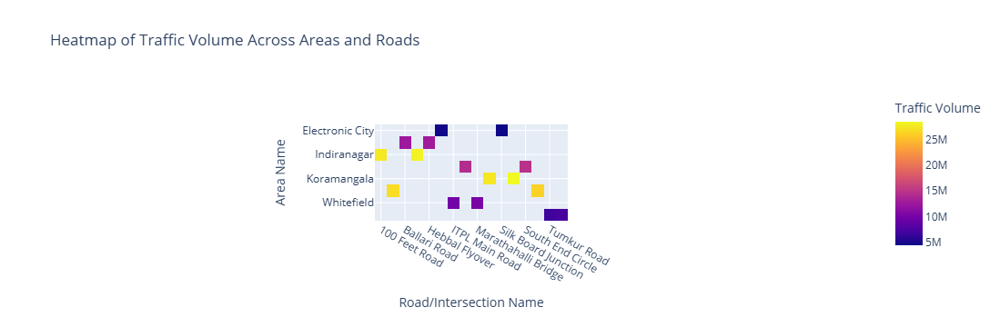

In [6]:
heatmap_data = df.pivot_table(values='Traffic Volume', index='Area Name', columns='Road/Intersection Name', aggfunc='sum')
fig = px.imshow(heatmap_data, labels=dict(x="Road/Intersection Name", y="Area Name", color="Traffic Volume"),
                title="Heatmap of Traffic Volume Across Areas and Roads")
fig.show()

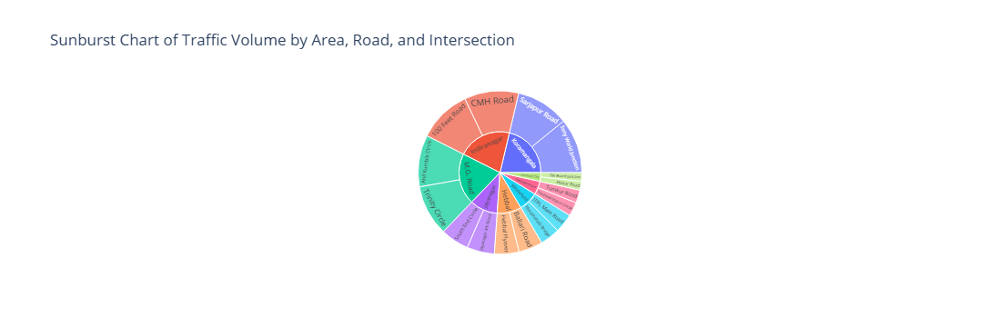

In [7]:
fig = px.sunburst(df, path=['Area Name', 'Road/Intersection Name'], values='Traffic Volume',
                  title="Sunburst Chart of Traffic Volume by Area, Road, and Intersection")
fig.show()

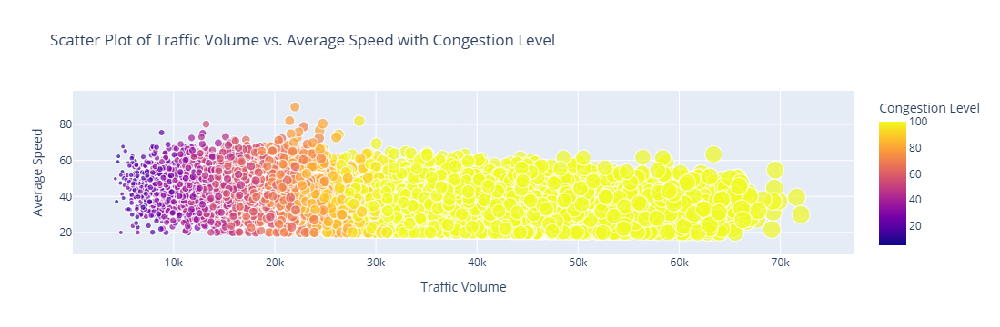

In [8]:
fig = px.scatter(df, x='Traffic Volume', y='Average Speed', color='Congestion Level', 
                 size='Traffic Volume', hover_data=['Area Name', 'Road/Intersection Name'],
                 title="Scatter Plot of Traffic Volume vs. Average Speed with Congestion Level")
fig.show()

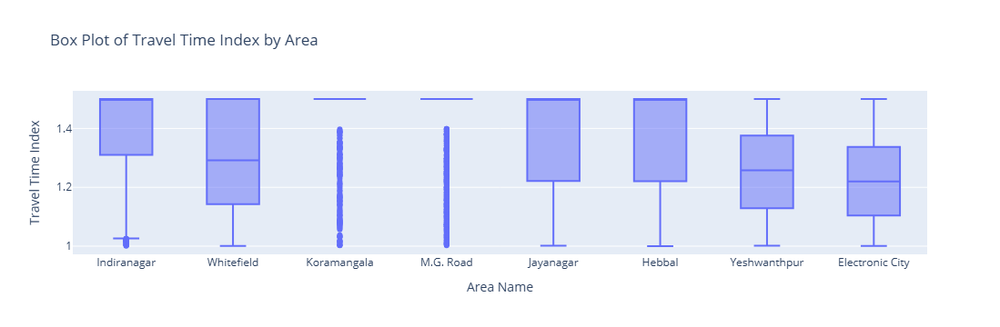

In [9]:
fig = px.box(df, x='Area Name', y='Travel Time Index', 
             title="Box Plot of Travel Time Index by Area")
fig.show()

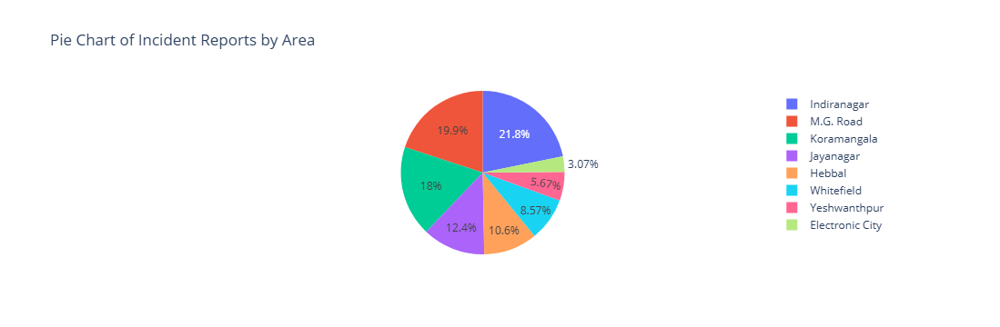

In [10]:
incident_data = df.groupby('Area Name')['Incident Reports'].sum().reset_index()
fig = px.pie(incident_data, values='Incident Reports', names='Area Name',
             title="Pie Chart of Incident Reports by Area")
fig.show()

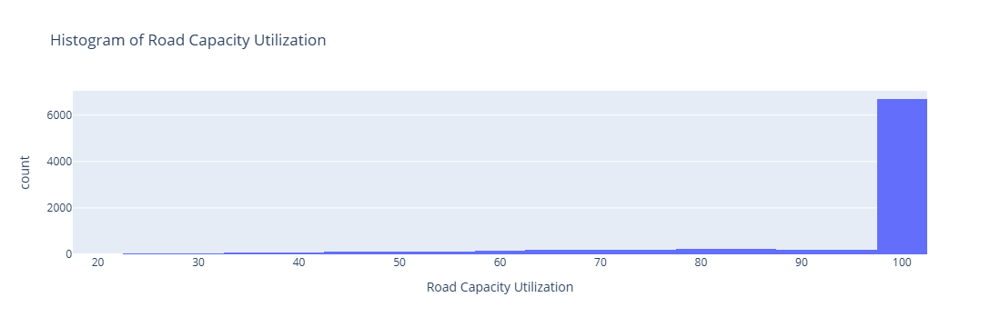

In [11]:
fig = px.histogram(df, x='Road Capacity Utilization', nbins=20,
                   title="Histogram of Road Capacity Utilization")
fig.show()

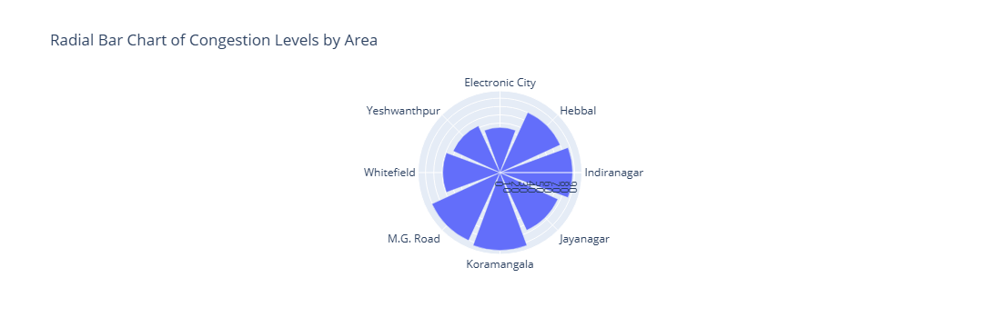

In [12]:
congestion_data = df.groupby('Area Name')['Congestion Level'].mean().reset_index()
fig = px.bar_polar(congestion_data, r='Congestion Level', theta='Area Name',
                   title="Radial Bar Chart of Congestion Levels by Area")
fig.show()

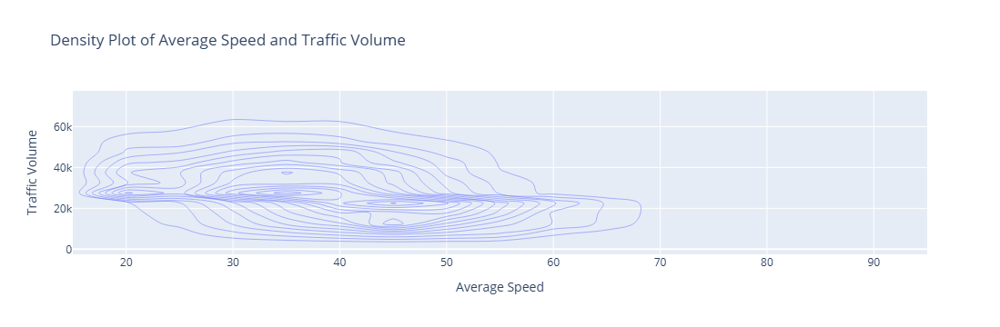

In [13]:
fig = px.density_contour(df, x='Average Speed', y='Traffic Volume',
                         title="Density Plot of Average Speed and Traffic Volume")
fig.show()

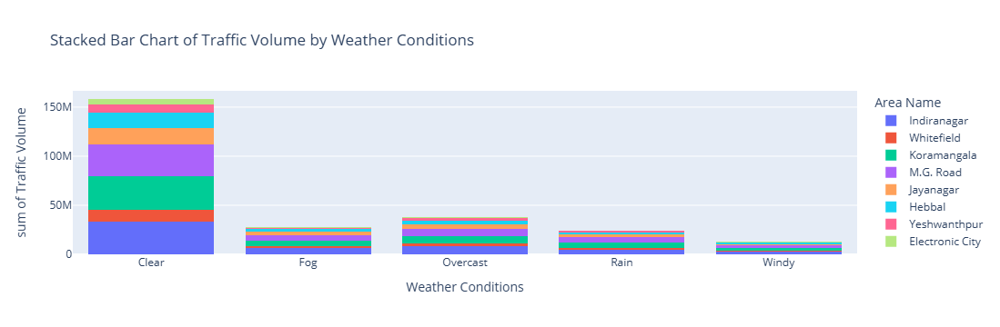

In [14]:
fig = px.histogram(df, x='Weather Conditions', y='Traffic Volume', color='Area Name', 
                   barmode='stack', title="Stacked Bar Chart of Traffic Volume by Weather Conditions")
fig.show()

In [15]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

numerical_columns = [
    'Traffic Volume', 'Average Speed', 'Travel Time Index', 'Congestion Level',
    'Road Capacity Utilization', 'Incident Reports', 'Environmental Impact',
    'Public Transport Usage', 'Traffic Signal Compliance', 'Parking Usage',
    'Pedestrian and Cyclist Count'
]
numerical_data = df[numerical_columns]

In [16]:
# Standardize the Data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numerical_data)

# Apply PCA
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)

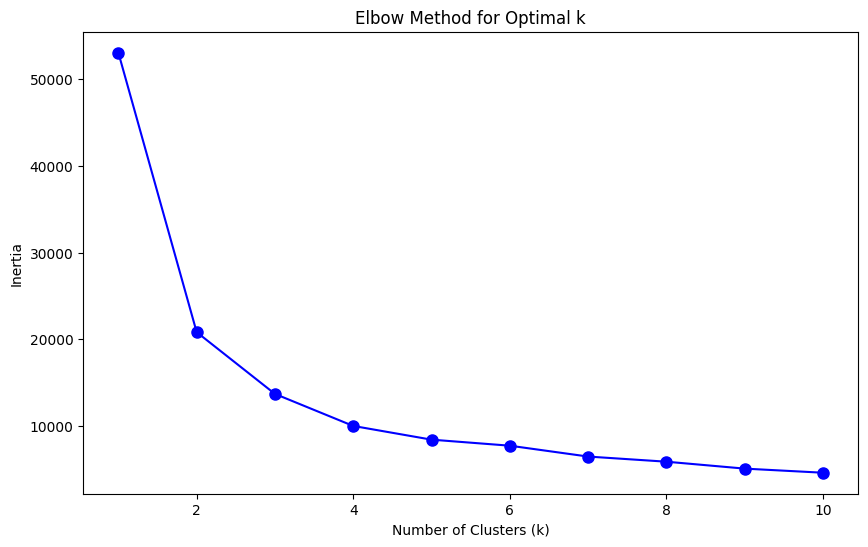

In [17]:
inertia = []
K = range(1, 11)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(pca_data)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(K, inertia, 'bo-', markersize=8)
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.show()

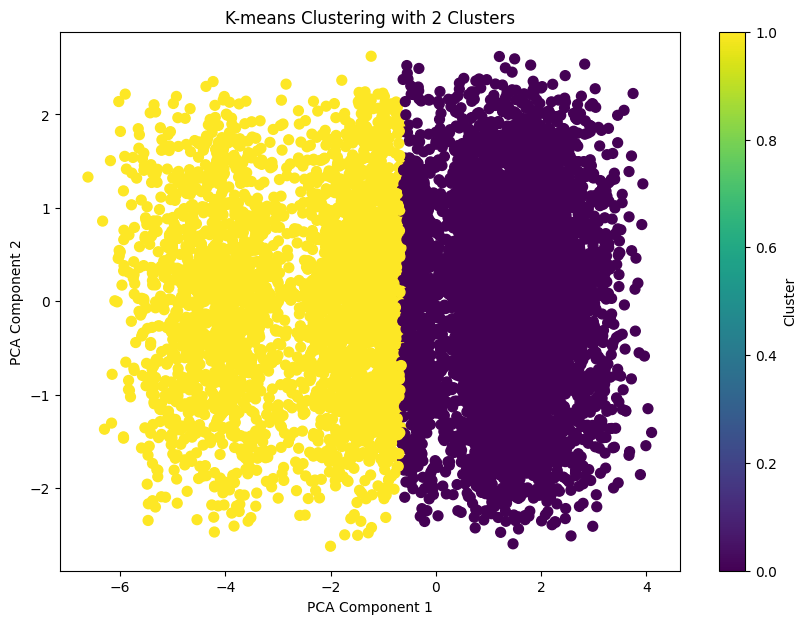

          0         1
0  1.357056  0.001392
1 -2.658391 -0.002726


In [18]:
optimal_k = 2

kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans.fit(pca_data)
df['Cluster'] = kmeans.labels_

# Visualize the Clusters
plt.figure(figsize=(10, 7))
plt.scatter(pca_data[:, 0], pca_data[:, 1], c=df['Cluster'], cmap='viridis', s=50)
plt.title(f'K-means Clustering with {optimal_k} Clusters')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(label='Cluster')
plt.show()

# Inspect Cluster Centers in Original Feature Space
cluster_centers = kmeans.cluster_centers_
cluster_centers_df = pd.DataFrame(cluster_centers)
print(cluster_centers_df)

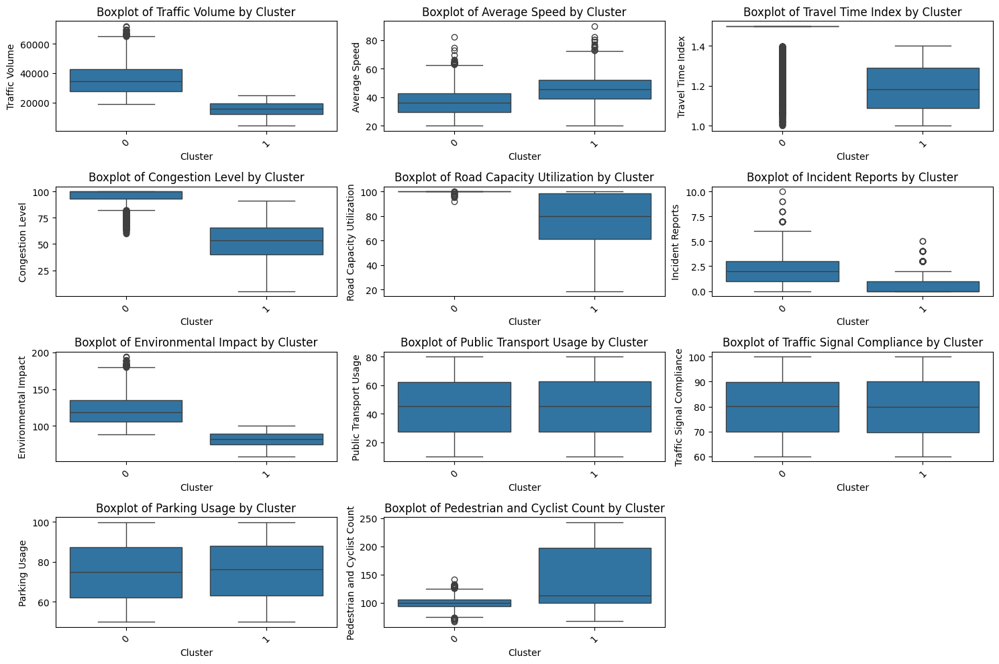

In [19]:
plt.figure(figsize=(15, 10))

for i, column in enumerate(numerical_columns, 1):
    plt.subplot(4, 3, i)
    sns.boxplot(x='Cluster', y=column, data=df)
    plt.title(f'Boxplot of {column} by Cluster')
    plt.xticks(rotation=45)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

In [20]:
aggregated_df = df.groupby(['Area Name', 'Road/Intersection Name']).agg({
    'Traffic Volume': 'mean',
    'Average Speed': 'mean',
    'Travel Time Index': 'mean',
    'Congestion Level': 'mean',
    'Road Capacity Utilization': 'mean',
    'Incident Reports': 'sum',
    'Environmental Impact': 'mean',
    'Public Transport Usage': 'mean',
    'Traffic Signal Compliance': 'mean',
    'Parking Usage': 'mean',
    'Pedestrian and Cyclist Count': 'mean',
    'Weather Conditions': lambda x: x.mode()[0],
    'Roadwork and Construction Activity': lambda x: x.mode()[0]
}).reset_index()


def generate_overall_advisory(row):
    advisories = []

    # Congestion Level Advisory
    if row['Congestion Level'] > 75:
        advisories.append("High Congestion: Recommend avoiding this area during peak hours.")
    elif row['Congestion Level'] > 50 and row['Congestion Level']<75:
        advisories.append("Moderate Congestion: Expect delays, consider alternate routes.")
    else:
        advisories.append("Low Congestion: Traffic flow is smooth.")

    # Incident Reports Advisory
    if row['Incident Reports'] > 10:  # Adjust threshold based on the entire data
        advisories.append("High Incident Rate: Increased likelihood of delays due to incidents.")
    elif row['Incident Reports'] > 5:
        advisories.append("Moderate Incident Rate: Stay alert for possible minor delays.")
    else:
        advisories.append("Low Incident Rate: No significant incidents reported.")

    # Environmental Impact Advisory
    if row['Environmental Impact'] > 150:
        advisories.append("High Environmental Impact: Consider reducing travel in this area to lower emissions.")
    elif row['Environmental Impact'] > 100:
        advisories.append("Moderate Environmental Impact: Monitor air quality if sensitive.")
    else:
        advisories.append("Low Environmental Impact: Air quality is within acceptable limits.")

    # Average Speed Advisory
    if row['Average Speed'] < 20:
        advisories.append("Low Speed: Traffic is slow, possibly due to congestion or road conditions.")
    elif row['Average Speed'] < 40:
        advisories.append("Moderate Speed: Traffic is moving but not at optimal speed.")
    else:
        advisories.append("High Speed: Traffic is moving smoothly.")

    # Travel Time Index Advisory
    if row['Travel Time Index'] > 1.3:
        advisories.append("High Travel Time Index: Expect longer travel times than usual.")
    else:
        advisories.append("Normal Travel Time Index: Travel times are as expected.")

    # Weather Conditions Advisory
    if row['Weather Conditions'] == 'Rain':
        advisories.append("Wet Conditions: Exercise caution due to wet roads.")
    elif row['Weather Conditions'] == 'Fog':
        advisories.append("Low Visibility: Drive carefully due to fog.")
    elif row['Weather Conditions'] == 'Clear':
        advisories.append("Clear Weather: No adverse weather conditions reported.")

    # Combine all advisories into a single string
    return " | ".join(advisories)

aggregated_df['Overall Advisory'] = aggregated_df.apply(generate_overall_advisory, axis=1)

for index, row in aggregated_df.iterrows():
    print(f"Area: {row['Area Name']}, Street: {row['Road/Intersection Name']}")
    print('\n')
    print(f"Overall Advisory: {row['Overall Advisory']}")
    print("-" * 180)

Area: Electronic City, Street: Hosur Road


Overall Advisory: Moderate Congestion: Expect delays, consider alternate routes. | High Incident Rate: Increased likelihood of delays due to incidents. | Low Environmental Impact: Air quality is within acceptable limits. | High Speed: Traffic is moving smoothly. | Normal Travel Time Index: Travel times are as expected. | Clear Weather: No adverse weather conditions reported.
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Area: Electronic City, Street: Silk Board Junction


Overall Advisory: Moderate Congestion: Expect delays, consider alternate routes. | High Incident Rate: Increased likelihood of delays due to incidents. | Low Environmental Impact: Air quality is within acceptable limits. | High Speed: Traffic is moving smoothly. | Normal Travel Time Index: Travel times are as expected. | Clear Weather: No adv